#### Goal - to make 2 figures 
##### Figure 1 - time series of wild fish per hour 7 days before 100% increase in hatchery fish and 7 days after
##### Figure 2 - bar plot of average over 7 days before hatchery release and 7 days after hatchery increase

In [27]:
#imports
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sys import platform

from scipy.signal import find_peaks
from scipy.signal import argrelextrema

In [3]:
if platform == "linux" or platform == "linux2":
    data_string = "/home/maria/Documents/data/pied_piper/"
    output_string = "/home/maria/Documents/output/pied_piper/"
else:
    data_string = "C:/Users/maria/OneDrive/Documents/data/pied_piper/"
    output_string = "C:/Users/maria/OneDrive/Documents/output/pied_piper/"

In [4]:
df = pd.read_csv(data_string + "dungeness_2005-2020_combine_ma_msd_atu_photoperiod.csv", header = 0)
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(df)

,Unnamed: 0,Unnamed: 0_x,Unnamed: 0.1,Date,In,chinook0_hatchery_perhour,chinook0_wild_perhour,chinook0_hatchery_num,chinook0_wild_num,chinook1_hatchery_perhour,chinook1_wild_perhour,chinook1_hatchery_num,chinook1_wild_num,coho1_hatchery_perhour,coho1_wild_perhour,coho1_hatchery_num,coho1_wild_num,steelheadsmolt_hatchery_perhour,steelheadsmolt_wild_perhour,steelheadsmolt_hatchery_num,steelheadsmolt_wild_num,pink0_hatchery_perhour,pink0_wild_perhour,pink0_hatchery_num,pink0_wild_num,chum0_wild_perhour,chum0_wild_num,flow,temp,doy,year,ma_chinook0_wild_perhour,msd_chinook0_wild_perhour,ma_chinook1_wild_perhour,msd_chinook1_wild_perhour,ma_coho1_wild_perhour,msd_coho1_wild_perhour,ma_steelheadsmolt_wild_perhour,msd_steelheadsmolt_wild_perhour,ma_chum0_wild_perhour,msd_chum0_wild_perhour,ma_pink0_wild_perhour,msd_pink0_wild_perhour,ma_temp,ma_flow,chinook0_wild_perhour_mean,chinook1_wild_perhour_mean,coho1_wild_perhour_mean,steelheadsmolt_wild_perhour_mean,chum0_wild_perhour_mean,pink0_wild_perhour_mean,temp_mean,flow_mean,ma_chinook0_wild_perhour_mean,msd_chinook0_wild_perhour_mean,ma_chinook1_wild_perhour_mean,msd_chinook1_wild_perhour_mean,ma_coho1_wild_perhour_mean,msd_coho1_wild_perhour_mean,ma_steelheadsmolt_wild_perhour_mean,msd_steelheadsmolt_wild_perhour_mean,ma_chum0_wild_perhour_mean,msd_chum0_wild_perhour_mean,ma_pink0_wild_perhour_mean,msd_pink0_wild_perhour_mean,ma_temp_mean,ma_flow_mean,temp_y,atu_solstice,temp_z,atu_april,Unnamed: 0_y,photoperiod
0,0,0,0,2005-03-08,19.733333,0.000000,4.358108,0.0,86.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,5.371622,0.0,106.0,13.581081,268.0,154.000000,7.000000,67,2005,6.427303,4.216610e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,70.129497,5.579530e+01,9.331162e+00,8.849078e+00,7.333333,169.416667,2.292856,0.000000,0.040055,0.004310,5.616000,36.781206,4.576167,322.718750,2.059401,0.664604,0.009222,0.005591,0.044752,3.402953e-02,0.015928,0.016310,6.712731,4.589944,23.445381,14.845106,4.517493,335.270493,7.152083,330.529836,NaN,NaN,66,11.500000
1,1,1,1,2005-03-09,19.583333,0.000000,8.159234,0.0,61.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,22.396268,0.0,91.0,141.391232,794.0,179.333333,7.800000,68,2005,6.544989,3.661161e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,66.780577,4.889697e+01,7.853446e+00,8.345529e+00,7.296667,169.133333,1.902207,0.008623,0.013579,0.000000,14.840670,5.994112,4.508802,377.708333,2.306909,1.011803,0.008137,0.005615,0.053040,4.197360e-02,0.013894,0.013135,7.897054,4.771679,23.660343,15.190011,4.599515,345.601148,7.455208,337.985044,NaN,NaN,67,11.566667
2,2,2,2,2005-03-10,23.300000,0.000000,1.800031,0.0,25.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,2.895837,0.0,40.0,40.919362,562.0,175.000000,7.200000,69,2005,7.068838,3.517071e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,65.603471,4.382972e+01,7.023682e+00,7.736235e+00,7.155556,167.361111,1.397627,0.004762,0.007547,0.013364,6.006996,18.828639,4.607123,315.733333,2.558576,0.963248,0.008709,0.005865,0.051861,4.265551e-02,0.016339,0.011624,9.213090,4.187352,29.628901,14.310770,4.728997,358.798214,7.430208,345.415252,NaN,NaN,68,11.616667
3,3,3,3,2005-03-11,24.266667,0.000000,11.391838,0.0,119.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,6.660921,0.0,75.0,84.626313,1038.0,169.333333,7.333333,70,2005,7.784130,3.726883e+00,0.000000,0.000000e+00,1.051709e-02,2.782561e-02,0.000000e+00,0.000000e+00,71.896267,4.333665e+01,6.693555e+00,7.115991e+00,7.083333,165.095238,3.303775,0.013993,0.110683,0.032239,11.091010,28.489916,4.851706,373.968750,2.711612,0.907228,0.006390,0.005597,0.046749,4.436930e-02,0.017665,0.012581,11.269826,4.395349,32.515987,15.596971,4.817864,361.650595,7.088542,352.503794,NaN,NaN,69,11.683333
4,4,4,4,2005-03-12,22.866667,0

In [8]:
#df['chinook0_hatchery_increase'] =  
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(df['chinook0_hatchery_perhour'])

0          0.000000
1          0.000000
2          0.000000
3          0.000000
4          0.000000
5          0.000000
6          0.000000
7          0.000000
8          0.000000
9          0.000000
10         0.000000
11         0.000000
12         0.000000
13         0.000000
14         0.000000
15         0.000000
16         0.000000
17         0.000000
18         0.000000
19         0.000000
20         0.000000
21         0.000000
22         0.000000
23         0.000000
24         0.000000
25         0.000000
26         0.000000
27         0.000000
28         0.000000
29         0.000000
30         0.000000
31         0.000000
32         0.000000
33         0.000000
34         0.000000
35         0.000000
36         0.000000
37         0.000000
38         0.000000
39         0.000000
40         0.000000
41         0.000000
42         0.000000
43         0.000000
44         0.000000
45         0.000000
46         0.000000
47         0.000000
48         0.000000
49         0.000000


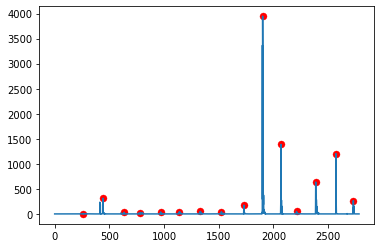

In [37]:
plt.plot(df['chinook0_hatchery_perhour'])
c_max_index = argrelextrema(df['chinook0_hatchery_perhour'].to_numpy(copy=False), np.greater, order=100)
plt.scatter(c_max_index[0],df['chinook0_hatchery_perhour'][c_max_index[0]],linewidth=0.3, s=50, c='r')

In [69]:
peaks, _ = find_peaks(df['chinook0_hatchery_perhour'], height=50) # height is the threshold value
print(peaks)
print(c_max_index[0])
peaks2, _ = find_peaks(df['chinook0_hatchery_perhour'], height=50, distance = 7) # height is the threshold value
print(peaks2)

[ 413  439  442 1332 1730 1732 1899 1901 1909 1913 2068 2073 2076 2386
 2390 2392 2398 2571 2728 2730 2735]
[ 261  442  634  784  968 1141 1332 1523 1730 1901 2068 2211 2386 2571
 2730]
[ 413  442 1332 1730 1901 1909 2068 2076 2386 2398 2571 2730]


In [90]:
#Write custom code to find first peak above a threshold in a minimum set of points
# with pd.option_context('display.max_rows', None, 'display.max_columns', None):
#     display(np.where(df['chinook0_hatchery_perhour'].pct_change() == np.inf))
# pct_change = np.where(df['chinook0_hatchery_perhour'].pct_change() > 50)
# above_threshold = np.where(df['chinook0_hatchery_perhour'] > 10)
# print(pct_change)
# print(above_threshold)
# np.intersect1d(pct_change,above_threshold)
peaks, _ = find_peaks(df['chinook0_hatchery_perhour'], height=50) # height is the threshold value
print(peaks)
peaks_list = []
for i in range(len(peaks)):
    if i == 0:
        peaks_list.append(peaks[i])
    else:
        
        if (peaks[i]  - peaks[i-1]) < 4:
            continue
        else:
            peaks_list.append(peaks[i])
            
print(peaks_list)           
    


[ 413  439  442 1332 1730 1732 1899 1901 1909 1913 2068 2073 2076 2386
 2390 2392 2398 2571 2728 2730 2735]
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
[413, 439, 1332, 1730, 1899, 1909, 1913, 2068, 2073, 2386, 2390, 2398, 2571, 2728, 2735]


In [104]:
before_after_0 = np.zeros([len(peaks_list),2])
before_after_1 = np.zeros([len(peaks_list),1])
before_after_2 = np.zeros([len(peaks_list),1])
before_after_3 = np.zeros([len(peaks_list),1])
before_after_4 = np.zeros([len(peaks_list),1])
before_after_mean = np.zeros([len(peaks_list),1])
for i in range(len(peaks_list)):
    before_after_0[i,0] = (np.mean(df['chinook0_wild_perhour'][(peaks_list[i] - 7) : (peaks_list[i] - 1)]))
    before_after_0[i,1] = (df['chinook0_wild_perhour'][peaks_list[i]]) #same day
    before_after_1[i,0] = (df['chinook0_wild_perhour'][peaks_list[i]+1]) #next day
    before_after_2[i,0] = (df['chinook0_wild_perhour'][peaks_list[i]+2]) #next day
    before_after_3[i,0] = (df['chinook0_wild_perhour'][peaks_list[i]+3]) #next day
    before_after_4[i,0] = (df['chinook0_wild_perhour'][peaks_list[i]+4]) #next day
    before_after_mean[i,0] = (np.mean(df['chinook0_wild_perhour'][(peaks_list[i]) : (peaks_list[i]+4)])) #next day
    
print(before_after_0)

[[ 1.33195259  1.65813665]
 [13.11303767 45.89167975]
 [ 4.87714584 11.88718087]
 [ 6.26122549  7.33333333]
 [ 1.59082696  2.66666667]
 [ 2.22010229  0.9375    ]
 [ 0.9145406   1.04761905]
 [ 0.40151703  7.62476929]
 [ 2.0697053   0.88      ]
 [ 1.908107   46.16025641]
 [ 9.23241394  3.        ]
 [ 3.23132892 61.05882353]
 [12.755959   27.39047619]
 [10.34861434 15.27346131]
 [19.89688757  9.5       ]]


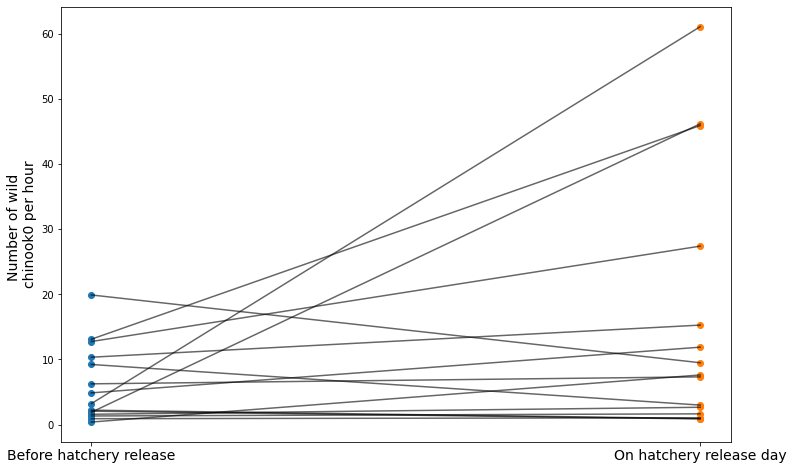

In [118]:
# plotting the points
fig = plt.figure(figsize=(12,8))
plt.scatter(np.zeros(len(before_after_0[:,0])), before_after_0[:,0])
plt.scatter(np.ones(len(before_after_0[:,1])), before_after_0[:,1])

# plotting the lines
for i in range(len(before_after_0[:,1])):
    plt.plot( [0,1], [before_after_0[i,0], before_after_0[i,1]], c='k', alpha = 0.6)

plt.xticks([0,1], ['Before hatchery release', 'On hatchery release day'], fontsize = 14)
plt.ylabel('Number of wild \nchinook0 per hour', fontsize = 14)
plt.show()

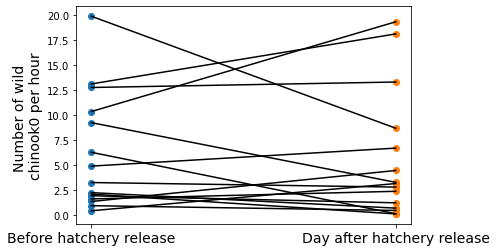

In [113]:
# plotting the points
plt.scatter(np.zeros(len(before_after_0[:,0])), before_after_0[:,0])
plt.scatter(np.ones(len(before_after_1[:,0])), before_after_1[:,0])

# plotting the lines
for i in range(len(before_after_1[:,0])):
    plt.plot( [0,1], [before_after_0[i,0], before_after_1[i,0]], c='k')

plt.xticks([0,1], ['Before hatchery release', 'Day after hatchery release'], fontsize = 14)
plt.ylabel('Number of wild \nchinook0 per hour', fontsize = 14)
plt.show()

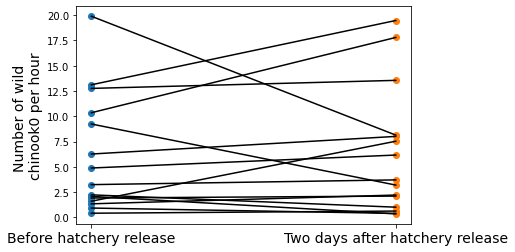

In [114]:
# plotting the points
plt.scatter(np.zeros(len(before_after_0[:,0])), before_after_0[:,0])
plt.scatter(np.ones(len(before_after_2[:,0])), before_after_2[:,0])

# plotting the lines
for i in range(len(before_after_2[:,0])):
    plt.plot( [0,1], [before_after_0[i,0], before_after_2[i,0]], c='k')

plt.xticks([0,1], ['Before hatchery release', 'Two days after hatchery release'], fontsize = 14)
plt.ylabel('Number of wild \nchinook0 per hour', fontsize = 14)
plt.show()

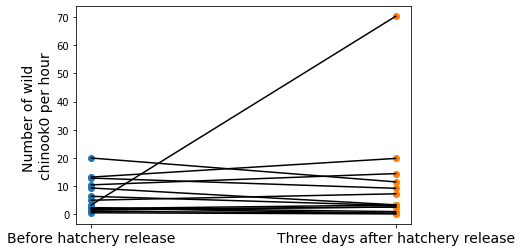

In [115]:
# plotting the points
plt.scatter(np.zeros(len(before_after_0[:,0])), before_after_0[:,0])
plt.scatter(np.ones(len(before_after_3[:,0])), before_after_3[:,0])

# plotting the lines
for i in range(len(before_after_3[:,0])):
    plt.plot( [0,1], [before_after_0[i,0], before_after_3[i,0]], c='k')

plt.xticks([0,1], ['Before hatchery release', 'Three days after hatchery release'], fontsize = 14)
plt.ylabel('Number of wild \nchinook0 per hour', fontsize = 14)
plt.show()

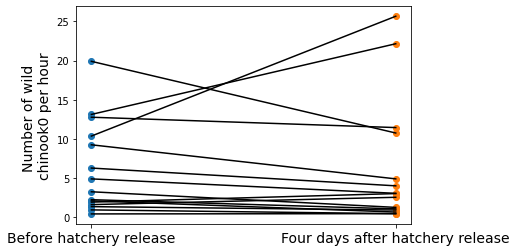

In [116]:
# plotting the points
plt.scatter(np.zeros(len(before_after_0[:,0])), before_after_0[:,0])
plt.scatter(np.ones(len(before_after_4[:,0])), before_after_4[:,0])

# plotting the lines
for i in range(len(before_after_4[:,0])):
    plt.plot( [0,1], [before_after_0[i,0], before_after_4[i,0]], c='k')

plt.xticks([0,1], ['Before hatchery release', 'Four days after hatchery release'], fontsize = 14)
plt.ylabel('Number of wild \nchinook0 per hour', fontsize = 14)
plt.show()

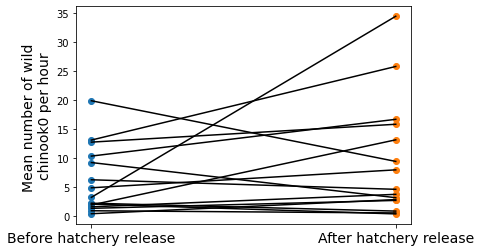

In [120]:
# plotting the points
plt.scatter(np.zeros(len(before_after_0[:,0])), before_after_0[:,0])
plt.scatter(np.ones(len(before_after_mean[:,0])), before_after_mean[:,0])

# plotting the lines
for i in range(len(before_after_0[:,0])):
    plt.plot( [0,1], [before_after_0[i,0], before_after_mean[i,0]], c='k')

plt.xticks([0,1], ['Before hatchery release', 'After hatchery release'], fontsize = 14)
plt.ylabel('Mean number of wild \nchinook0 per hour', fontsize = 14)
plt.show()

[  29  211  553  726  915 1056 1239]
[29, 211, 553, 726, 915, 1056, 1239]
[[0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]]


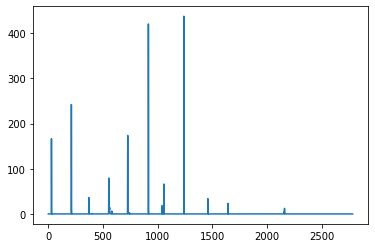

In [123]:
#chinook1
plt.plot(df['chinook1_hatchery_perhour'])
peaks_chinook1, _ = find_peaks(df['chinook1_hatchery_perhour'], height=50) # height is the threshold value
print(peaks_chinook1)
peaks_chinook1_list = []
for i in range(len(peaks_chinook1)):
    if i == 0:
        peaks_chinook1_list.append(peaks_chinook1[i])
    else:
        
        if (peaks_chinook1[i]  - peaks_chinook1[i-1]) < 4:
            continue
        else:
            peaks_chinook1_list.append(peaks_chinook1[i])
            
print(peaks_chinook1_list)           
before_after_chinook1 = np.zeros([len(peaks_chinook1_list),1])    
before_after_chinook1_0 = np.zeros([len(peaks_chinook1_list),1])
before_after_chinook1_1 = np.zeros([len(peaks_chinook1_list),1])
before_after_chinook1_2 = np.zeros([len(peaks_chinook1_list),1])
before_after_chinook1_3 = np.zeros([len(peaks_chinook1_list),1])
before_after_chinook1_4 = np.zeros([len(peaks_chinook1_list),1])
before_after_chinook1_mean = np.zeros([len(peaks_chinook1_list),1])
for i in range(len(peaks_chinook1_list)):
    before_after_chinook1[i,0] = (np.mean(df['chinook1_wild_perhour'][(peaks_chinook1_list[i] - 7) : (peaks_chinook1_list[i] - 1)]))
    before_after_chinook1_0[i,0] = (df['chinook1_wild_perhour'][peaks_chinook1_list[i]]) #same day
    before_after_chinook1_1[i,0] = (df['chinook1_wild_perhour'][peaks_chinook1_list[i]+1]) #next day
    before_after_chinook1_2[i,0] = (df['chinook1_wild_perhour'][peaks_chinook1_list[i]+2]) #next day
    before_after_chinook1_3[i,0] = (df['chinook1_wild_perhour'][peaks_chinook1_list[i]+3]) #next day
    before_after_chinook1_4[i,0] = (df['chinook1_wild_perhour'][peaks_chinook1_list[i]+4]) #next day
    before_after_chinook1_mean[i,0] = (np.mean(df['chinook1_wild_perhour'][(peaks_chinook1_list[i]) : (peaks_chinook1_list[i]+4)])) #next day
    
print(before_after_chinook1_0)

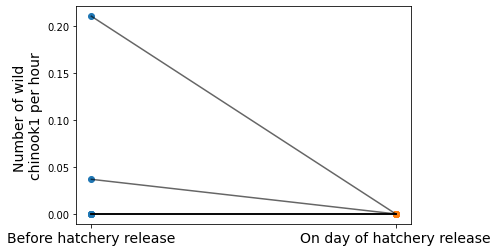

In [127]:
# plotting the points
plt.scatter(np.zeros(len(before_after_chinook1[:,0])), before_after_chinook1[:,0])
plt.scatter(np.ones(len(before_after_chinook1_0[:,0])), before_after_chinook1_0[:,0])

# plotting the lines
for i in range(len(before_after_chinook1_0[:,0])):
    plt.plot( [0,1], [before_after_chinook1[i,0], before_after_chinook1_0[i,0]], c='k', alpha = 0.6)

plt.xticks([0,1], ['Before hatchery release', 'On day of hatchery release'], fontsize = 14)
plt.ylabel('Number of wild \nchinook1 per hour', fontsize = 14)
plt.show()

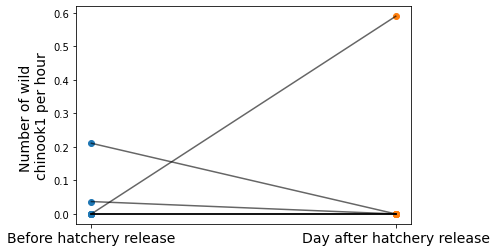

In [126]:
# plotting the points
plt.scatter(np.zeros(len(before_after_chinook1[:,0])), before_after_chinook1[:,0])
plt.scatter(np.ones(len(before_after_chinook1_1[:,0])), before_after_chinook1_1[:,0])

# plotting the lines
for i in range(len(before_after_chinook1_0[:,0])):
    plt.plot( [0,1], [before_after_chinook1[i,0], before_after_chinook1_1[i,0]], c='k', alpha = 0.6)

plt.xticks([0,1], ['Before hatchery release', 'Day after hatchery release'], fontsize = 14)
plt.ylabel('Number of wild \nchinook1 per hour', fontsize = 14)
plt.show()

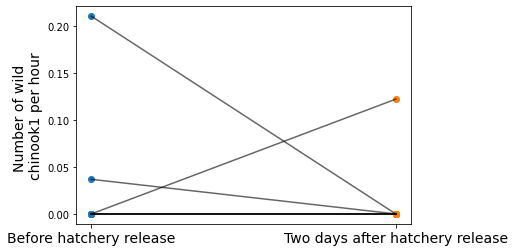

In [128]:
# plotting the points
plt.scatter(np.zeros(len(before_after_chinook1[:,0])), before_after_chinook1[:,0])
plt.scatter(np.ones(len(before_after_chinook1_2[:,0])), before_after_chinook1_2[:,0])

# plotting the lines
for i in range(len(before_after_chinook1_0[:,0])):
    plt.plot( [0,1], [before_after_chinook1[i,0], before_after_chinook1_2[i,0]], c='k', alpha = 0.6)

plt.xticks([0,1], ['Before hatchery release', 'Two days after hatchery release'], fontsize = 14)
plt.ylabel('Number of wild \nchinook1 per hour', fontsize = 14)
plt.show()

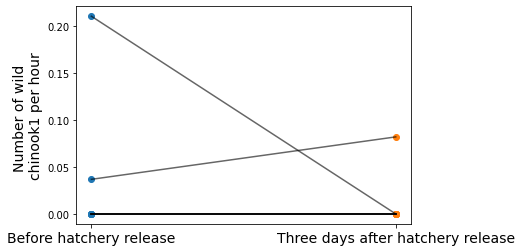

In [129]:
# plotting the points
plt.scatter(np.zeros(len(before_after_chinook1[:,0])), before_after_chinook1[:,0])
plt.scatter(np.ones(len(before_after_chinook1_3[:,0])), before_after_chinook1_3[:,0])

# plotting the lines
for i in range(len(before_after_chinook1_0[:,0])):
    plt.plot( [0,1], [before_after_chinook1[i,0], before_after_chinook1_3[i,0]], c='k', alpha = 0.6)

plt.xticks([0,1], ['Before hatchery release', 'Three days after hatchery release'], fontsize = 14)
plt.ylabel('Number of wild \nchinook1 per hour', fontsize = 14)
plt.show()

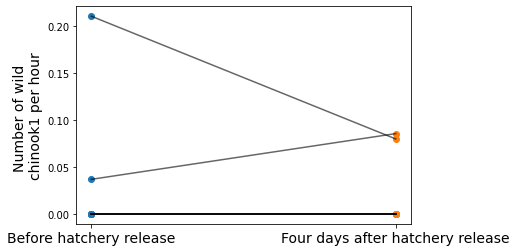

In [130]:
# plotting the points
plt.scatter(np.zeros(len(before_after_chinook1[:,0])), before_after_chinook1[:,0])
plt.scatter(np.ones(len(before_after_chinook1_4[:,0])), before_after_chinook1_4[:,0])

# plotting the lines
for i in range(len(before_after_chinook1_0[:,0])):
    plt.plot( [0,1], [before_after_chinook1[i,0], before_after_chinook1_4[i,0]], c='k', alpha = 0.6)

plt.xticks([0,1], ['Before hatchery release', 'Four days after hatchery release'], fontsize = 14)
plt.ylabel('Number of wild \nchinook1 per hour', fontsize = 14)
plt.show()

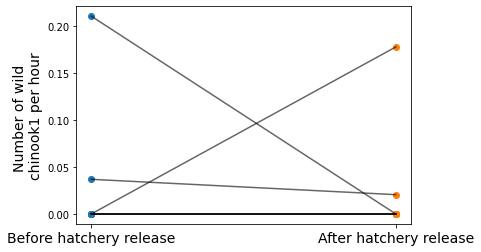

In [131]:
# plotting the points
plt.scatter(np.zeros(len(before_after_chinook1[:,0])), before_after_chinook1[:,0])
plt.scatter(np.ones(len(before_after_chinook1_mean[:,0])), before_after_chinook1_mean[:,0])

# plotting the lines
for i in range(len(before_after_chinook1_0[:,0])):
    plt.plot( [0,1], [before_after_chinook1[i,0], before_after_chinook1_mean[i,0]], c='k', alpha = 0.6)

plt.xticks([0,1], ['Before hatchery release', 'After hatchery release'], fontsize = 14)
plt.ylabel('Number of wild \nchinook1 per hour', fontsize = 14)
plt.show()

[  55   57   60  426  428  612  784  954 1116 1119 1301 1304 1503 1697
 1879 1883 1887 1891 2048 2199 2201 2373 2546 2548 2552 2557 2707]
[55, 426, 612, 784, 954, 1116, 1301, 1503, 1697, 1879, 1883, 1887, 1891, 2048, 2199, 2373, 2546, 2552, 2557, 2707]
[[12.62352941]
 [ 0.        ]
 [ 6.17054264]
 [ 5.70225564]
 [ 8.44664032]
 [ 3.78947368]
 [ 1.40512821]
 [ 0.60869565]
 [ 7.51020408]
 [ 2.26188135]
 [ 2.        ]
 [ 0.        ]
 [ 1.33333333]
 [18.18529957]
 [ 1.        ]
 [32.4       ]
 [16.43774069]
 [25.1509434 ]
 [37.07692308]
 [ 2.28      ]]


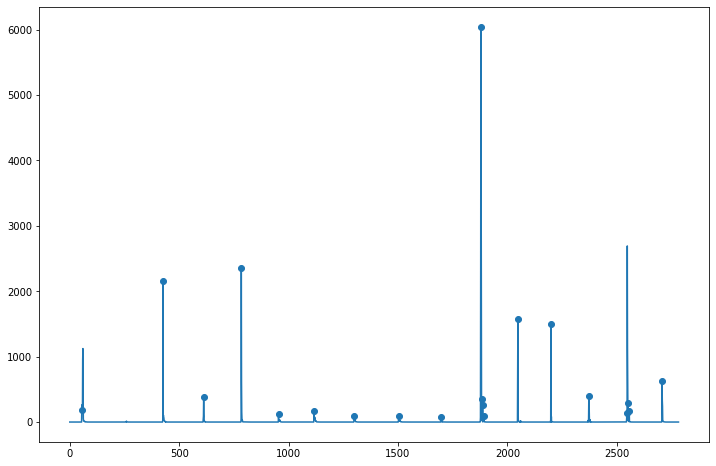

In [136]:
#coho
fig = plt.figure(figsize=(12,8))
plt.plot(df['coho1_hatchery_perhour'])
peaks_coho1, _ = find_peaks(df['coho1_hatchery_perhour'], height=50) # height is the threshold value
print(peaks_coho1)
peaks_coho1_list = []
for i in range(len(peaks_coho1)):
    if i == 0:
        peaks_coho1_list.append(peaks_coho1[i])
    else:
        
        if (peaks_coho1[i]  - peaks_coho1[i-1]) < 4:
            continue
        else:
            peaks_coho1_list.append(peaks_coho1[i])
            
print(peaks_coho1_list) 
plt.scatter(peaks_coho1_list,df['coho1_hatchery_perhour'][peaks_coho1_list])
before_after_coho1 = np.zeros([len(peaks_coho1_list),1])    
before_after_coho1_0 = np.zeros([len(peaks_coho1_list),1])
before_after_coho1_1 = np.zeros([len(peaks_coho1_list),1])
before_after_coho1_2 = np.zeros([len(peaks_coho1_list),1])
before_after_coho1_3 = np.zeros([len(peaks_coho1_list),1])
before_after_coho1_4 = np.zeros([len(peaks_coho1_list),1])
before_after_coho1_mean = np.zeros([len(peaks_coho1_list),1])
for i in range(len(peaks_coho1_list)):
    before_after_coho1[i,0] = (np.mean(df['coho1_wild_perhour'][(peaks_coho1_list[i] - 7) : (peaks_coho1_list[i] - 1)]))
    before_after_coho1_0[i,0] = (df['coho1_wild_perhour'][peaks_coho1_list[i]]) #same day
    before_after_coho1_1[i,0] = (df['coho1_wild_perhour'][peaks_coho1_list[i]+1]) #next day
    before_after_coho1_2[i,0] = (df['coho1_wild_perhour'][peaks_coho1_list[i]+2]) #next day
    before_after_coho1_3[i,0] = (df['coho1_wild_perhour'][peaks_coho1_list[i]+3]) #next day
    before_after_coho1_4[i,0] = (df['coho1_wild_perhour'][peaks_coho1_list[i]+4]) #next day
    before_after_coho1_mean[i,0] = (np.mean(df['coho1_wild_perhour'][(peaks_coho1_list[i]) : (peaks_coho1_list[i]+4)])) #next day
    
print(before_after_coho1_0)



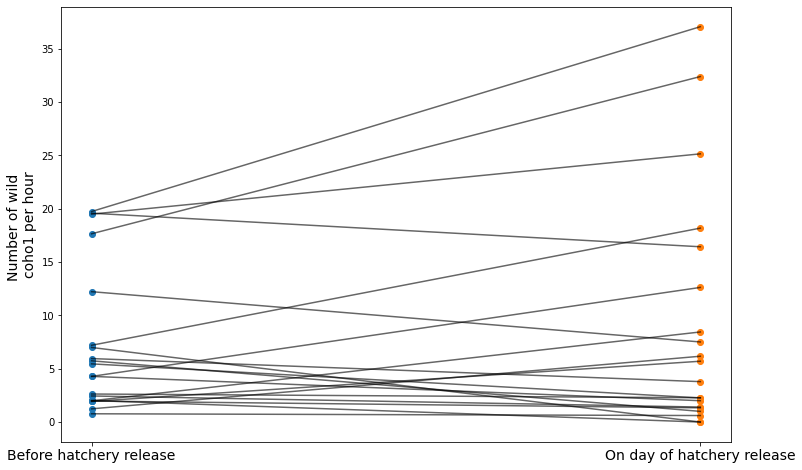

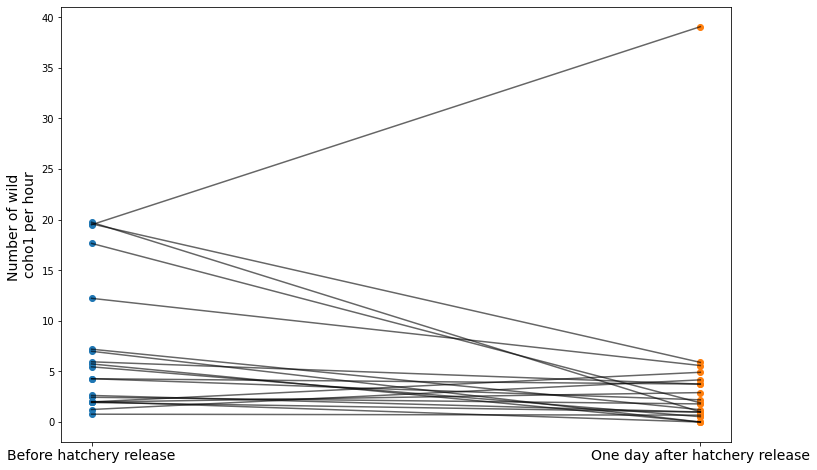

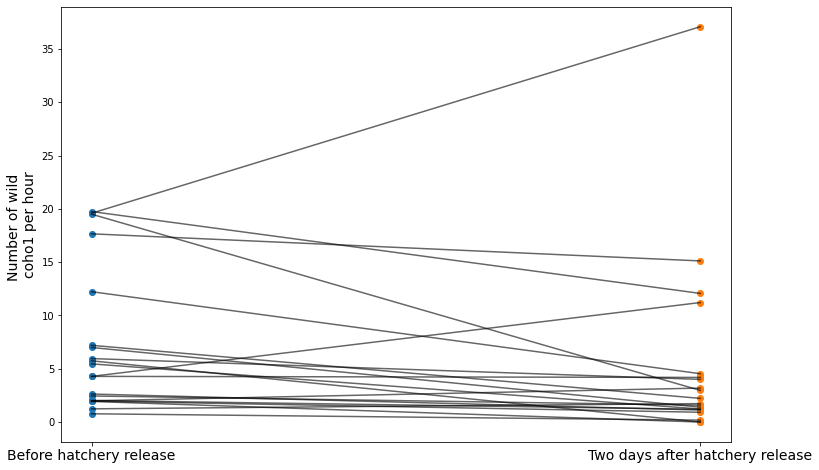

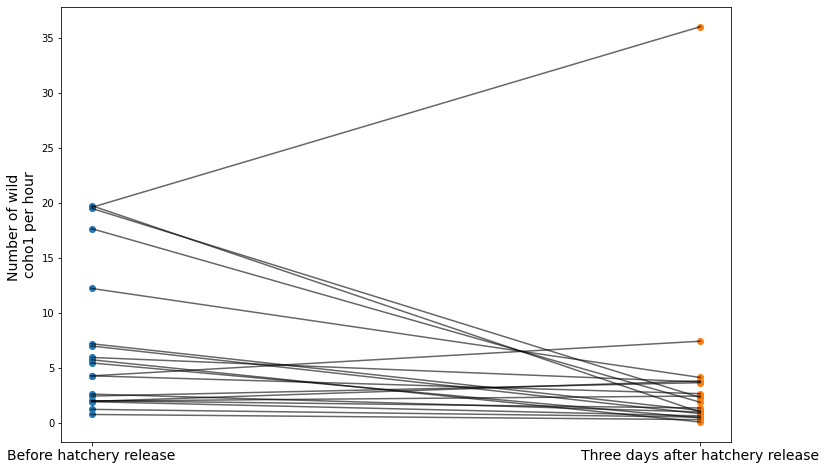

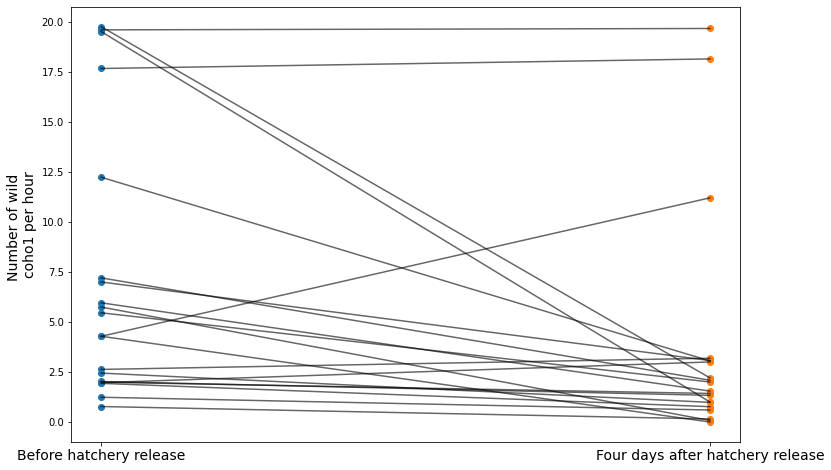

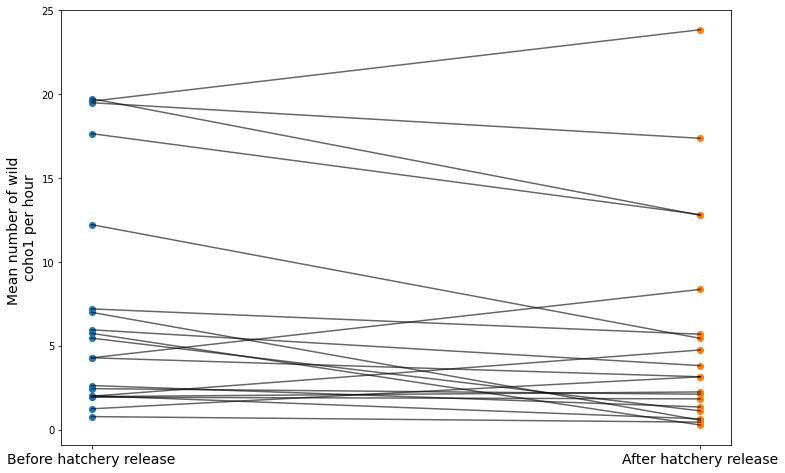

In [139]:
# plotting the points
fig = plt.figure(figsize=(12,8))
plt.scatter(np.zeros(len(before_after_coho1[:,0])), before_after_coho1[:,0])
plt.scatter(np.ones(len(before_after_coho1_0[:,0])), before_after_coho1_0[:,0])

# plotting the lines
for i in range(len(before_after_coho1_0[:,0])):
    plt.plot( [0,1], [before_after_coho1[i,0], before_after_coho1_0[i,0]], c='k', alpha = 0.6)

plt.xticks([0,1], ['Before hatchery release', 'On day of hatchery release'], fontsize = 14)
plt.ylabel('Number of wild \ncoho1 per hour', fontsize = 14)
plt.show()

# plotting the points
fig = plt.figure(figsize=(12,8))
plt.scatter(np.zeros(len(before_after_coho1[:,0])), before_after_coho1[:,0])
plt.scatter(np.ones(len(before_after_coho1_1[:,0])), before_after_coho1_1[:,0])

# plotting the lines
for i in range(len(before_after_coho1_0[:,0])):
    plt.plot( [0,1], [before_after_coho1[i,0], before_after_coho1_1[i,0]], c='k', alpha = 0.6)

plt.xticks([0,1], ['Before hatchery release', 'One day after hatchery release'], fontsize = 14)
plt.ylabel('Number of wild \ncoho1 per hour', fontsize = 14)
plt.show()

# plotting the points
fig = plt.figure(figsize=(12,8))
plt.scatter(np.zeros(len(before_after_coho1[:,0])), before_after_coho1[:,0])
plt.scatter(np.ones(len(before_after_coho1_2[:,0])), before_after_coho1_2[:,0])

# plotting the lines
for i in range(len(before_after_coho1_0[:,0])):
    plt.plot( [0,1], [before_after_coho1[i,0], before_after_coho1_2[i,0]], c='k', alpha = 0.6)

plt.xticks([0,1], ['Before hatchery release', 'Two days after hatchery release'], fontsize = 14)
plt.ylabel('Number of wild \ncoho1 per hour', fontsize = 14)
plt.show()

# plotting the points
fig = plt.figure(figsize=(12,8))
plt.scatter(np.zeros(len(before_after_coho1[:,0])), before_after_coho1[:,0])
plt.scatter(np.ones(len(before_after_coho1_3[:,0])), before_after_coho1_3[:,0])

# plotting the lines
for i in range(len(before_after_coho1_0[:,0])):
    plt.plot( [0,1], [before_after_coho1[i,0], before_after_coho1_3[i,0]], c='k', alpha = 0.6)

plt.xticks([0,1], ['Before hatchery release', 'Three days after hatchery release'], fontsize = 14)
plt.ylabel('Number of wild \ncoho1 per hour', fontsize = 14)
plt.show()

# plotting the points
fig = plt.figure(figsize=(12,8))
plt.scatter(np.zeros(len(before_after_coho1[:,0])), before_after_coho1[:,0])
plt.scatter(np.ones(len(before_after_coho1_4[:,0])), before_after_coho1_4[:,0])

# plotting the lines
for i in range(len(before_after_coho1_0[:,0])):
    plt.plot( [0,1], [before_after_coho1[i,0], before_after_coho1_4[i,0]], c='k', alpha = 0.6)

plt.xticks([0,1], ['Before hatchery release', 'Four days after hatchery release'], fontsize = 14)
plt.ylabel('Number of wild \ncoho1 per hour', fontsize = 14)
plt.show()

# plotting the points
fig = plt.figure(figsize=(12,8))
plt.scatter(np.zeros(len(before_after_coho1[:,0])), before_after_coho1[:,0])
plt.scatter(np.ones(len(before_after_coho1_mean[:,0])), before_after_coho1_mean[:,0])

# plotting the lines
for i in range(len(before_after_coho1_0[:,0])):
    plt.plot( [0,1], [before_after_coho1[i,0], before_after_coho1_mean[i,0]], c='k', alpha = 0.6)

plt.xticks([0,1], ['Before hatchery release', 'After hatchery release'], fontsize = 14)
plt.ylabel('Mean number of wild \ncoho1 per hour', fontsize = 14)
plt.show()




[  50   52  428  612 1116 1120 1125 1301 1304 2035]
[50, 428, 612, 1116, 1120, 1125, 1301, 2035]
[[0.58333333]
 [0.19672131]
 [2.59136213]
 [4.42105263]
 [2.        ]
 [2.75      ]
 [0.83076923]
 [1.30769231]]


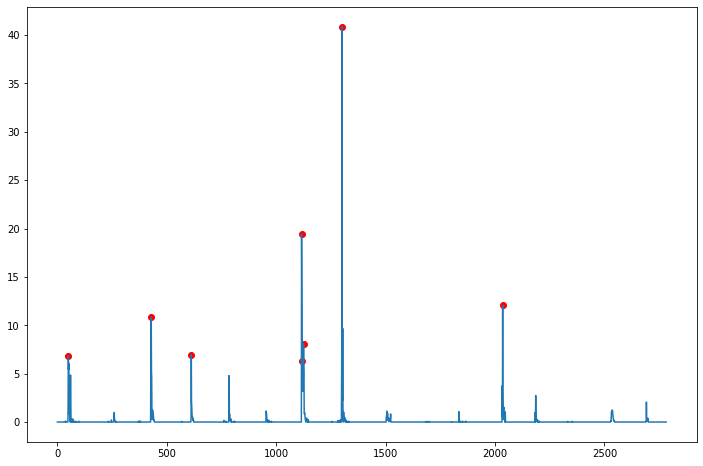

In [147]:
#steelhead

fig = plt.figure(figsize=(12,8))
plt.plot(df['steelheadsmolt_hatchery_perhour'])
peaks_steelheadsmolt, _ = find_peaks(df['steelheadsmolt_hatchery_perhour'], height=5) # height is the threshold value
print(peaks_steelheadsmolt)
peaks_steelheadsmolt_list = []
for i in range(len(peaks_steelheadsmolt)):
    if i == 0:
        peaks_steelheadsmolt_list.append(peaks_steelheadsmolt[i])
    else:
        
        if (peaks_steelheadsmolt[i]  - peaks_steelheadsmolt[i-1]) < 4: #changing 4 to 10
            continue
        else:
            peaks_steelheadsmolt_list.append(peaks_steelheadsmolt[i])
            
print(peaks_steelheadsmolt_list) 
plt.scatter(peaks_steelheadsmolt_list,df['steelheadsmolt_hatchery_perhour'][peaks_steelheadsmolt_list], color = 'r')
before_after_steelheadsmolt = np.zeros([len(peaks_steelheadsmolt_list),1])    
before_after_steelheadsmolt_0 = np.zeros([len(peaks_steelheadsmolt_list),1])
before_after_steelheadsmolt_1 = np.zeros([len(peaks_steelheadsmolt_list),1])
before_after_steelheadsmolt_2 = np.zeros([len(peaks_steelheadsmolt_list),1])
before_after_steelheadsmolt_3 = np.zeros([len(peaks_steelheadsmolt_list),1])
before_after_steelheadsmolt_4 = np.zeros([len(peaks_steelheadsmolt_list),1])
before_after_steelheadsmolt_mean = np.zeros([len(peaks_steelheadsmolt_list),1])
for i in range(len(peaks_steelheadsmolt_list)):
    before_after_steelheadsmolt[i,0] = (np.mean(df['steelheadsmolt_wild_perhour'][(peaks_steelheadsmolt_list[i] - 7) : (peaks_steelheadsmolt_list[i] - 1)]))
    before_after_steelheadsmolt_0[i,0] = (df['steelheadsmolt_wild_perhour'][peaks_steelheadsmolt_list[i]]) #same day
    before_after_steelheadsmolt_1[i,0] = (df['steelheadsmolt_wild_perhour'][peaks_steelheadsmolt_list[i]+1]) #next day
    before_after_steelheadsmolt_2[i,0] = (df['steelheadsmolt_wild_perhour'][peaks_steelheadsmolt_list[i]+2]) #next day
    before_after_steelheadsmolt_3[i,0] = (df['steelheadsmolt_wild_perhour'][peaks_steelheadsmolt_list[i]+3]) #next day
    before_after_steelheadsmolt_4[i,0] = (df['steelheadsmolt_wild_perhour'][peaks_steelheadsmolt_list[i]+4]) #next day
    before_after_steelheadsmolt_mean[i,0] = (np.mean(df['steelheadsmolt_wild_perhour'][(peaks_steelheadsmolt_list[i]) : (peaks_steelheadsmolt_list[i]+4)])) #next day
    
print(before_after_steelheadsmolt_0)


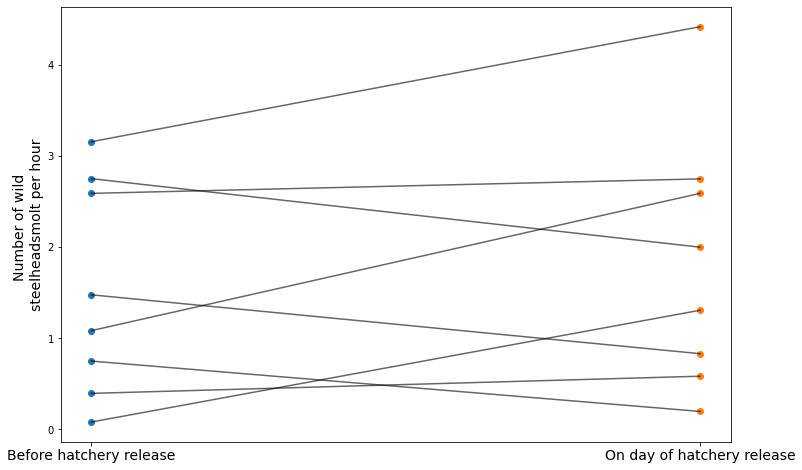

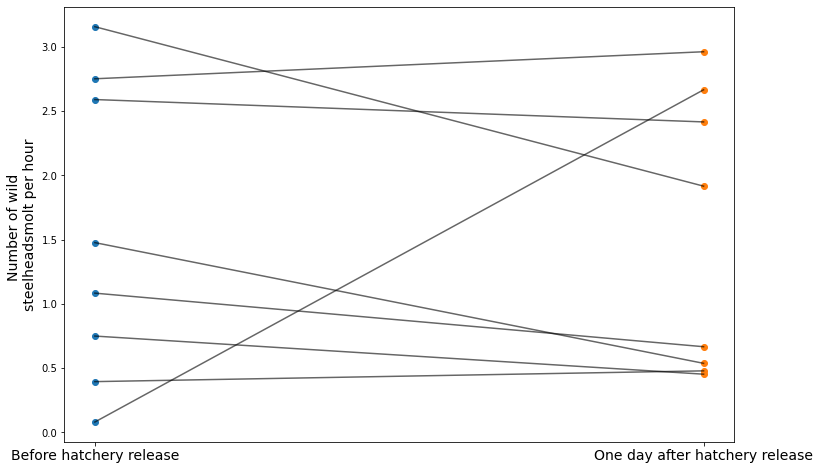

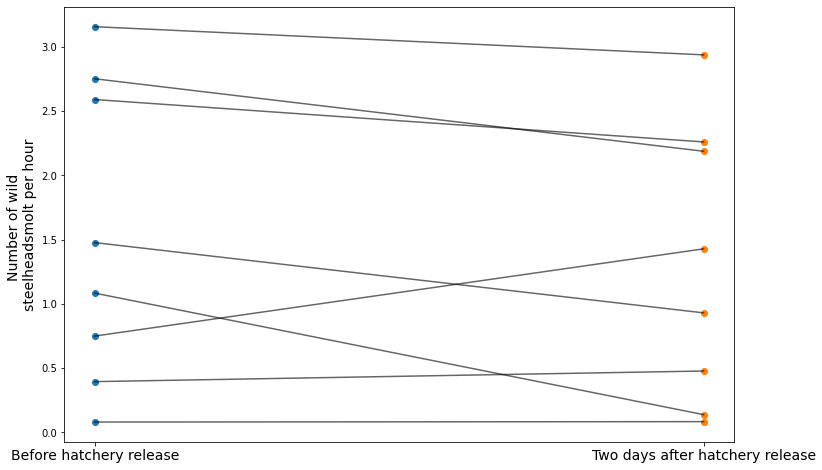

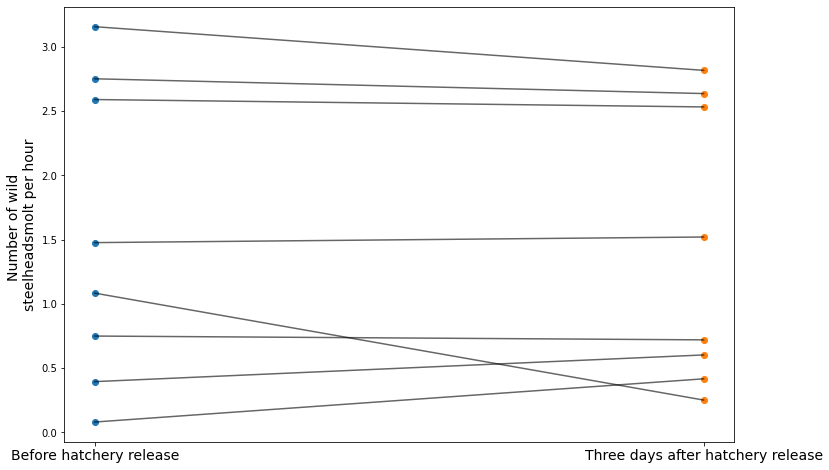

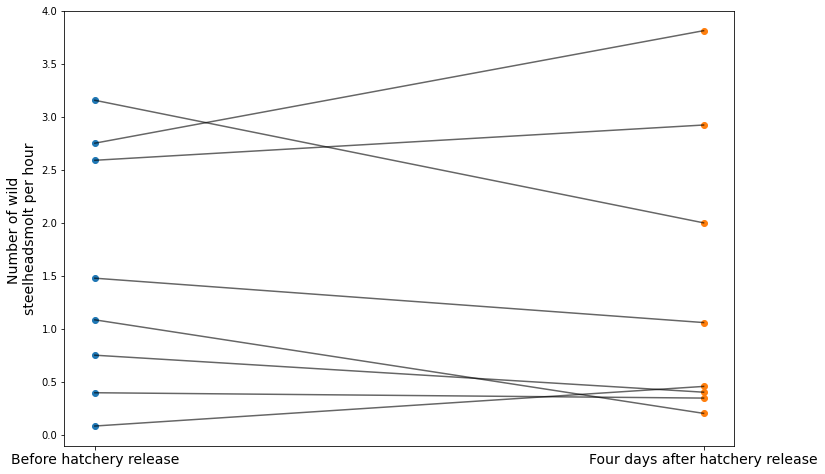

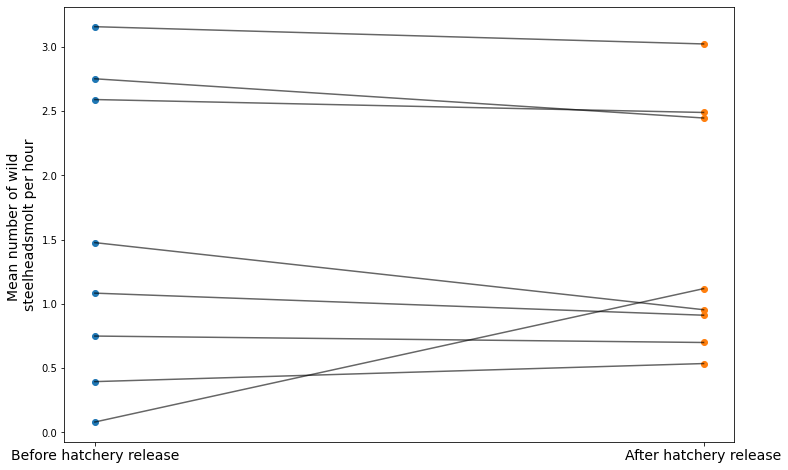

In [148]:
#steelheadsmolt

# plotting the points
fig = plt.figure(figsize=(12,8))
plt.scatter(np.zeros(len(before_after_steelheadsmolt[:,0])), before_after_steelheadsmolt[:,0])
plt.scatter(np.ones(len(before_after_steelheadsmolt_0[:,0])), before_after_steelheadsmolt_0[:,0])

# plotting the lines
for i in range(len(before_after_steelheadsmolt_0[:,0])):
    plt.plot( [0,1], [before_after_steelheadsmolt[i,0], before_after_steelheadsmolt_0[i,0]], c='k', alpha = 0.6)

plt.xticks([0,1], ['Before hatchery release', 'On day of hatchery release'], fontsize = 14)
plt.ylabel('Number of wild \nsteelheadsmolt per hour', fontsize = 14)
plt.show()

# plotting the points
fig = plt.figure(figsize=(12,8))
plt.scatter(np.zeros(len(before_after_steelheadsmolt[:,0])), before_after_steelheadsmolt[:,0])
plt.scatter(np.ones(len(before_after_steelheadsmolt_1[:,0])), before_after_steelheadsmolt_1[:,0])

# plotting the lines
for i in range(len(before_after_steelheadsmolt_0[:,0])):
    plt.plot( [0,1], [before_after_steelheadsmolt[i,0], before_after_steelheadsmolt_1[i,0]], c='k', alpha = 0.6)

plt.xticks([0,1], ['Before hatchery release', 'One day after hatchery release'], fontsize = 14)
plt.ylabel('Number of wild \nsteelheadsmolt per hour', fontsize = 14)
plt.show()

# plotting the points
fig = plt.figure(figsize=(12,8))
plt.scatter(np.zeros(len(before_after_steelheadsmolt[:,0])), before_after_steelheadsmolt[:,0])
plt.scatter(np.ones(len(before_after_steelheadsmolt_2[:,0])), before_after_steelheadsmolt_2[:,0])

# plotting the lines
for i in range(len(before_after_steelheadsmolt_0[:,0])):
    plt.plot( [0,1], [before_after_steelheadsmolt[i,0], before_after_steelheadsmolt_2[i,0]], c='k', alpha = 0.6)

plt.xticks([0,1], ['Before hatchery release', 'Two days after hatchery release'], fontsize = 14)
plt.ylabel('Number of wild \nsteelheadsmolt per hour', fontsize = 14)
plt.show()

# plotting the points
fig = plt.figure(figsize=(12,8))
plt.scatter(np.zeros(len(before_after_steelheadsmolt[:,0])), before_after_steelheadsmolt[:,0])
plt.scatter(np.ones(len(before_after_steelheadsmolt_3[:,0])), before_after_steelheadsmolt_3[:,0])

# plotting the lines
for i in range(len(before_after_steelheadsmolt_0[:,0])):
    plt.plot( [0,1], [before_after_steelheadsmolt[i,0], before_after_steelheadsmolt_3[i,0]], c='k', alpha = 0.6)

plt.xticks([0,1], ['Before hatchery release', 'Three days after hatchery release'], fontsize = 14)
plt.ylabel('Number of wild \nsteelheadsmolt per hour', fontsize = 14)
plt.show()

# plotting the points
fig = plt.figure(figsize=(12,8))
plt.scatter(np.zeros(len(before_after_steelheadsmolt[:,0])), before_after_steelheadsmolt[:,0])
plt.scatter(np.ones(len(before_after_steelheadsmolt_4[:,0])), before_after_steelheadsmolt_4[:,0])

# plotting the lines
for i in range(len(before_after_steelheadsmolt_0[:,0])):
    plt.plot( [0,1], [before_after_steelheadsmolt[i,0], before_after_steelheadsmolt_4[i,0]], c='k', alpha = 0.6)

plt.xticks([0,1], ['Before hatchery release', 'Four days after hatchery release'], fontsize = 14)
plt.ylabel('Number of wild \nsteelheadsmolt per hour', fontsize = 14)
plt.show()

# plotting the points
fig = plt.figure(figsize=(12,8))
plt.scatter(np.zeros(len(before_after_steelheadsmolt[:,0])), before_after_steelheadsmolt[:,0])
plt.scatter(np.ones(len(before_after_steelheadsmolt_mean[:,0])), before_after_steelheadsmolt_mean[:,0])

# plotting the lines
for i in range(len(before_after_steelheadsmolt_0[:,0])):
    plt.plot( [0,1], [before_after_steelheadsmolt[i,0], before_after_steelheadsmolt_mean[i,0]], c='k', alpha = 0.6)

plt.xticks([0,1], ['Before hatchery release', 'After hatchery release'], fontsize = 14)
plt.ylabel('Mean number of wild \nsteelheadsmolt per hour', fontsize = 14)
plt.show()



[  29  211  553  726  915 1056 1239]
[29, 211, 553, 726, 915, 1056, 1239]
[[ 0.30596352]
 [ 2.        ]
 [ 0.        ]
 [ 0.18181818]
 [ 0.        ]
 [ 0.        ]
 [71.8       ]]


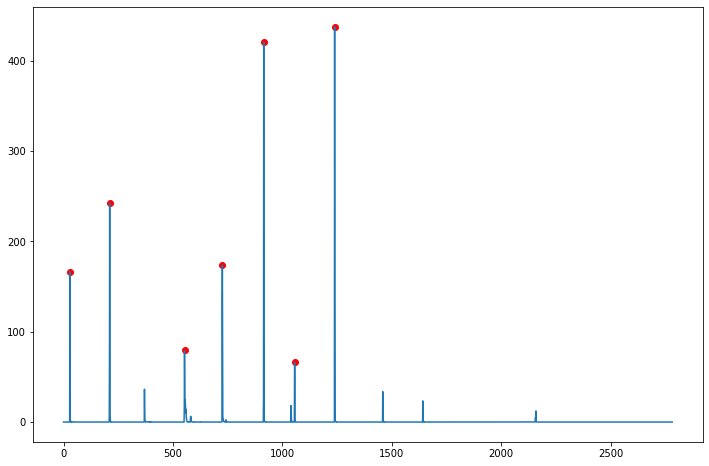

In [150]:
#looking at the influence of chinook1 on chinook0


fig = plt.figure(figsize=(12,8))
plt.plot(df['chinook1_hatchery_perhour'])
peaks_chinook1_on0, _ = find_peaks(df['chinook1_hatchery_perhour'], height=50) # height is the threshold value
print(peaks_chinook1_on0)
peaks_chinook1_on0_list = []
for i in range(len(peaks_chinook1_on0)):
    if i == 0:
        peaks_chinook1_on0_list.append(peaks_chinook1_on0[i])
    else:
        
        if (peaks_chinook1_on0[i]  - peaks_chinook1_on0[i-1]) < 4: #changing 4 to 10
            continue
        else:
            peaks_chinook1_on0_list.append(peaks_chinook1_on0[i])
            
print(peaks_chinook1_on0_list) 
plt.scatter(peaks_chinook1_on0_list,df['chinook1_hatchery_perhour'][peaks_chinook1_on0_list], color = 'r')
before_after_chinook1_on0 = np.zeros([len(peaks_chinook1_on0_list),1])    
before_after_chinook1_on0_0 = np.zeros([len(peaks_chinook1_on0_list),1])
before_after_chinook1_on0_minus1 = np.zeros([len(peaks_chinook1_on0_list),1])

for i in range(len(peaks_chinook1_on0_list)):
    before_after_chinook1_on0[i,0] = (np.mean(df['chinook0_wild_perhour'][(peaks_chinook1_on0_list[i] - 7) : (peaks_chinook1_on0_list[i] - 1)]))
    before_after_chinook1_on0_0[i,0] = (df['chinook0_wild_perhour'][peaks_chinook1_on0_list[i]]) #same day
    before_after_chinook1_on0_minus1[i,0] = (df['chinook0_wild_perhour'][peaks_chinook1_on0_list[i]-1]) #same day
     
print(before_after_chinook1_on0_0)





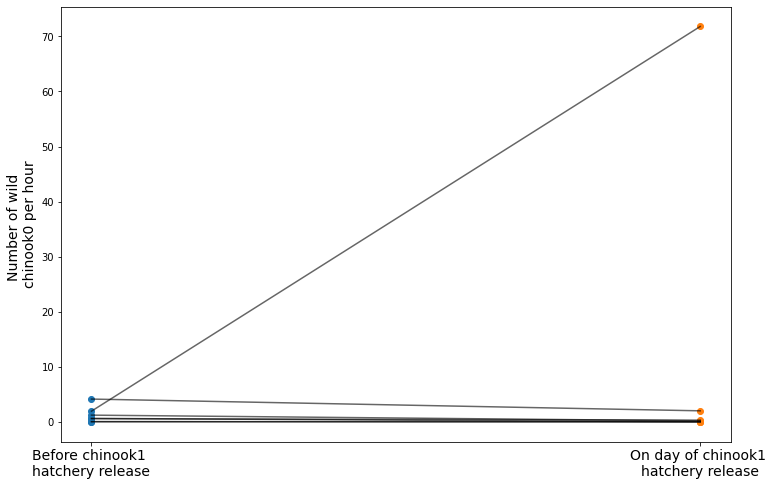

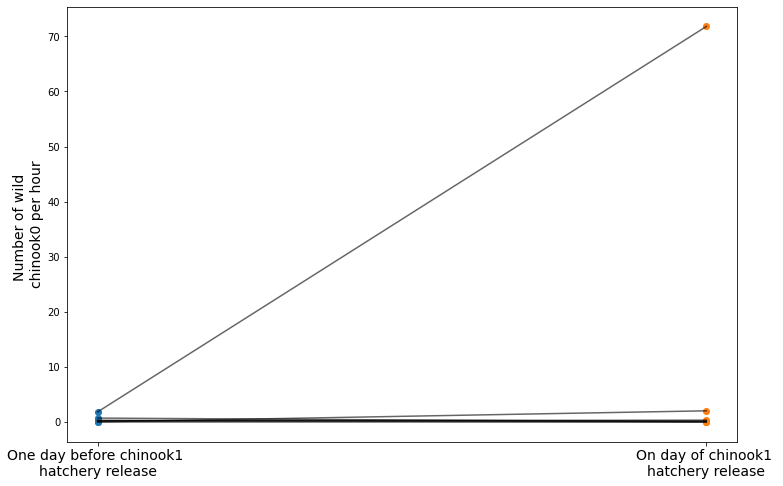

In [152]:
#influence of chinook1 on chinook0

# plotting the points
fig = plt.figure(figsize=(12,8))
plt.scatter(np.zeros(len(before_after_chinook1_on0[:,0])), before_after_chinook1_on0[:,0])
plt.scatter(np.ones(len(before_after_chinook1_on0_0[:,0])), before_after_chinook1_on0_0[:,0])

# plotting the lines
for i in range(len(before_after_chinook1_on0_0[:,0])):
    plt.plot( [0,1], [before_after_chinook1_on0[i,0], before_after_chinook1_on0_0[i,0]], c='k', alpha = 0.6)

plt.xticks([0,1], ['Before chinook1 \nhatchery release', 'On day of chinook1 \nhatchery release'], fontsize = 14)
plt.ylabel('Number of wild \nchinook0 per hour', fontsize = 14)
plt.show()

# plotting the points
fig = plt.figure(figsize=(12,8))
plt.scatter(np.zeros(len(before_after_chinook1_on0_minus1[:,0])), before_after_chinook1_on0_minus1[:,0])
plt.scatter(np.ones(len(before_after_chinook1_on0_0[:,0])), before_after_chinook1_on0_0[:,0])

# plotting the lines
for i in range(len(before_after_chinook1_on0_0[:,0])):
    plt.plot( [0,1], [before_after_chinook1_on0_minus1[i,0], before_after_chinook1_on0_0[i,0]], c='k', alpha = 0.6)

plt.xticks([0,1], ['One day before chinook1 \nhatchery release', 'On day of chinook1 \nhatchery release'], fontsize = 14)
plt.ylabel('Number of wild \nchinook0 per hour', fontsize = 14)
plt.show()

[  55   57   60  426  428  612  784  954 1116 1119 1301 1304 1503 1697
 1879 1883 1887 1891 2048 2199 2201 2373 2546 2548 2552 2557 2707]
[55, 426, 612, 784, 954, 1116, 1301, 1503, 1697, 1879, 1883, 1887, 1891, 2048, 2199, 2373, 2546, 2552, 2557, 2707]
[[ 2.30481283]
 [ 6.        ]
 [ 2.16611296]
 [29.46616541]
 [ 1.35573123]
 [ 2.        ]
 [ 4.11897436]
 [ 5.56521739]
 [ 1.25110914]
 [ 1.86692888]
 [ 0.76923077]
 [ 0.81818182]
 [ 1.33333333]
 [ 0.37059914]
 [ 0.67142857]
 [ 0.4       ]
 [ 5.41955499]
 [ 1.22509873]
 [ 4.74898785]
 [ 3.2       ]]


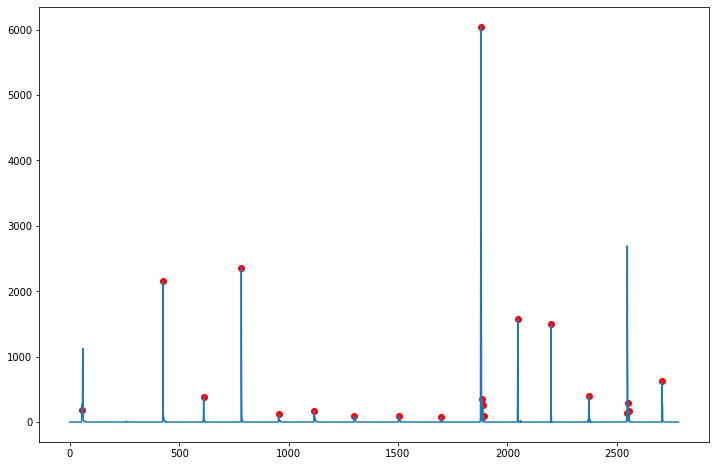

In [153]:
#looking at the influence of coho1 on chinook0


fig = plt.figure(figsize=(12,8))
plt.plot(df['coho1_hatchery_perhour'])
peaks_coho1_on0, _ = find_peaks(df['coho1_hatchery_perhour'], height=50) # height is the threshold value
print(peaks_coho1_on0)
peaks_coho1_on0_list = []
for i in range(len(peaks_coho1_on0)):
    if i == 0:
        peaks_coho1_on0_list.append(peaks_coho1_on0[i])
    else:
        
        if (peaks_coho1_on0[i]  - peaks_coho1_on0[i-1]) < 4: #changing 4 to 10
            continue
        else:
            peaks_coho1_on0_list.append(peaks_coho1_on0[i])
            
print(peaks_coho1_on0_list) 
plt.scatter(peaks_coho1_on0_list,df['coho1_hatchery_perhour'][peaks_coho1_on0_list], color = 'r')
before_after_coho1_on0 = np.zeros([len(peaks_coho1_on0_list),1])    
before_after_coho1_on0_0 = np.zeros([len(peaks_coho1_on0_list),1])
before_after_coho1_on0_minus1 = np.zeros([len(peaks_coho1_on0_list),1])

for i in range(len(peaks_coho1_on0_list)):
    before_after_coho1_on0[i,0] = (np.mean(df['chinook0_wild_perhour'][(peaks_coho1_on0_list[i] - 7) : (peaks_coho1_on0_list[i] - 1)]))
    before_after_coho1_on0_0[i,0] = (df['chinook0_wild_perhour'][peaks_coho1_on0_list[i]]) #same day
    before_after_coho1_on0_minus1[i,0] = (df['chinook0_wild_perhour'][peaks_coho1_on0_list[i]-1]) #same day
     
print(before_after_coho1_on0_0)




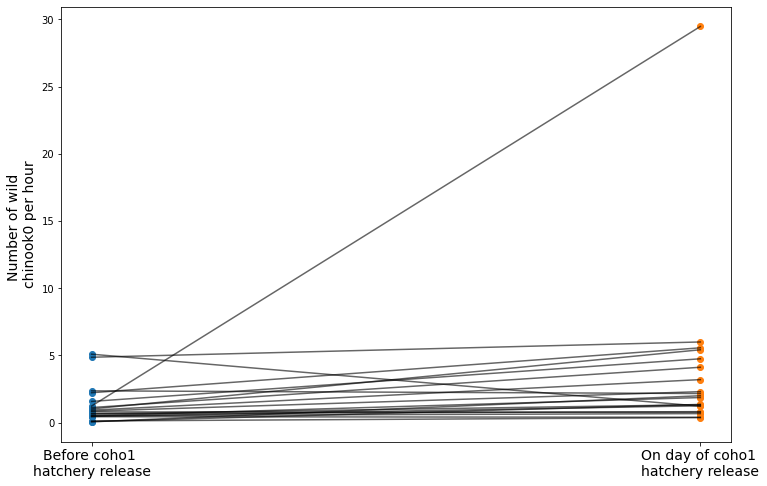

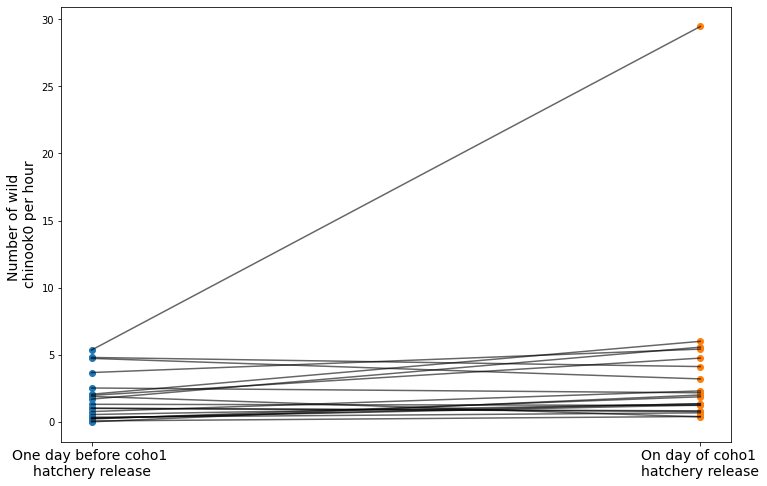

In [154]:
#influence of coho1 on chinook0

# plotting the points
fig = plt.figure(figsize=(12,8))
plt.scatter(np.zeros(len(before_after_coho1_on0[:,0])), before_after_coho1_on0[:,0])
plt.scatter(np.ones(len(before_after_coho1_on0_0[:,0])), before_after_coho1_on0_0[:,0])

# plotting the lines
for i in range(len(before_after_coho1_on0_0[:,0])):
    plt.plot( [0,1], [before_after_coho1_on0[i,0], before_after_coho1_on0_0[i,0]], c='k', alpha = 0.6)

plt.xticks([0,1], ['Before coho1 \nhatchery release', 'On day of coho1 \nhatchery release'], fontsize = 14)
plt.ylabel('Number of wild \nchinook0 per hour', fontsize = 14)
plt.show()

# plotting the points
fig = plt.figure(figsize=(12,8))
plt.scatter(np.zeros(len(before_after_coho1_on0_minus1[:,0])), before_after_coho1_on0_minus1[:,0])
plt.scatter(np.ones(len(before_after_coho1_on0_0[:,0])), before_after_coho1_on0_0[:,0])

# plotting the lines
for i in range(len(before_after_coho1_on0_0[:,0])):
    plt.plot( [0,1], [before_after_coho1_on0_minus1[i,0], before_after_coho1_on0_0[i,0]], c='k', alpha = 0.6)

plt.xticks([0,1], ['One day before coho1 \nhatchery release', 'On day of coho1 \nhatchery release'], fontsize = 14)
plt.ylabel('Number of wild \nchinook0 per hour', fontsize = 14)
plt.show()

[  55   57   60  426  428  612  784  954 1116 1119 1301 1304 1503 1697
 1879 1883 1887 1891 2048 2199 2201 2373 2546 2548 2552 2557 2707]
[55, 426, 612, 784, 954, 1116, 1301, 1503, 1697, 1879, 1883, 1887, 1891, 2048, 2199, 2373, 2546, 2552, 2557, 2707]
[[0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.13043478]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.09090909]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]
 [0.        ]]


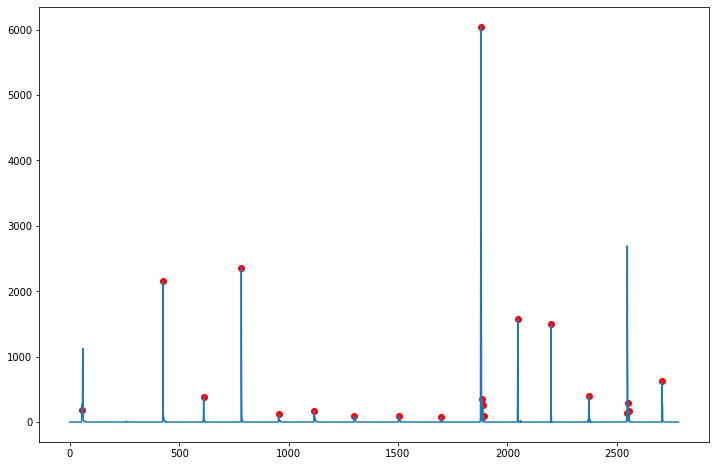

In [155]:
#looking at the influence of coho1 on chinook1


fig = plt.figure(figsize=(12,8))
plt.plot(df['coho1_hatchery_perhour'])
peaks_coho1_on1, _ = find_peaks(df['coho1_hatchery_perhour'], height=50) # height is the threshold value
print(peaks_coho1_on1)
peaks_coho1_on1_list = []
for i in range(len(peaks_coho1_on1)):
    if i == 0:
        peaks_coho1_on1_list.append(peaks_coho1_on1[i])
    else:
        
        if (peaks_coho1_on1[i]  - peaks_coho1_on1[i-1]) < 4: #changing 4 to 10
            continue
        else:
            peaks_coho1_on1_list.append(peaks_coho1_on1[i])
            
print(peaks_coho1_on1_list) 
plt.scatter(peaks_coho1_on1_list,df['coho1_hatchery_perhour'][peaks_coho1_on1_list], color = 'r')
before_after_coho1_on1 = np.zeros([len(peaks_coho1_on1_list),1])    
before_after_coho1_on1_0 = np.zeros([len(peaks_coho1_on1_list),1])
before_after_coho1_on1_minus1 = np.zeros([len(peaks_coho1_on1_list),1])

for i in range(len(peaks_coho1_on1_list)):
    before_after_coho1_on1[i,0] = (np.mean(df['chinook1_wild_perhour'][(peaks_coho1_on1_list[i] - 7) : (peaks_coho1_on1_list[i] - 1)]))
    before_after_coho1_on1_0[i,0] = (df['chinook1_wild_perhour'][peaks_coho1_on1_list[i]]) #same day
    before_after_coho1_on1_minus1[i,0] = (df['chinook1_wild_perhour'][peaks_coho1_on1_list[i]-1]) #same day
     
print(before_after_coho1_on1_0)




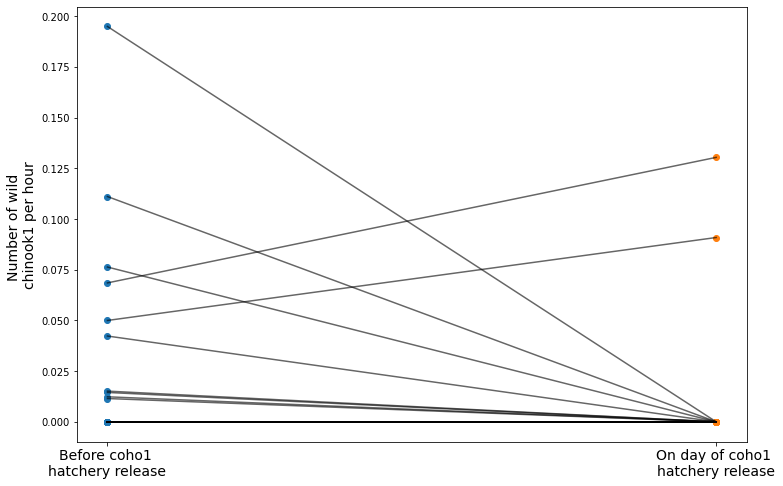

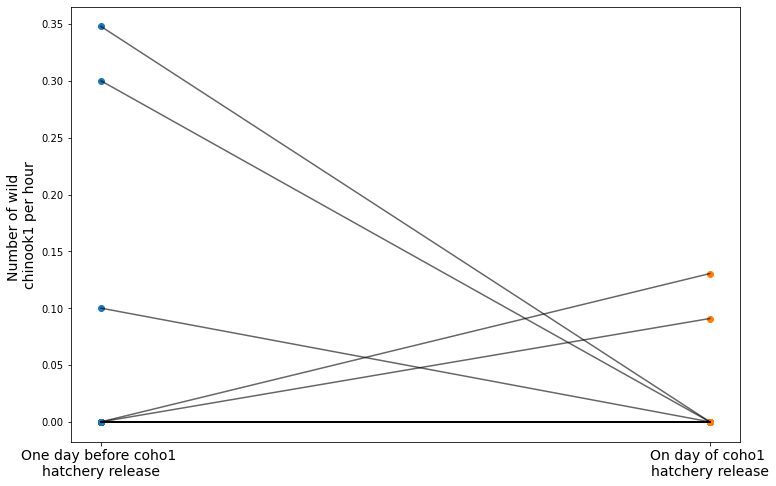

In [157]:
#looking at the influence of coho1 on chinook1


# plotting the points
fig = plt.figure(figsize=(12,8))
plt.scatter(np.zeros(len(before_after_coho1_on1[:,0])), before_after_coho1_on1[:,0])
plt.scatter(np.ones(len(before_after_coho1_on1_0[:,0])), before_after_coho1_on1_0[:,0])

# plotting the lines
for i in range(len(before_after_coho1_on1_0[:,0])):
    plt.plot( [0,1], [before_after_coho1_on1[i,0], before_after_coho1_on1_0[i,0]], c='k', alpha = 0.6)

plt.xticks([0,1], ['Before coho1 \nhatchery release', 'On day of coho1 \nhatchery release'], fontsize = 14)
plt.ylabel('Number of wild \nchinook1 per hour', fontsize = 14)
plt.show()

# plotting the points
fig = plt.figure(figsize=(12,8))
plt.scatter(np.zeros(len(before_after_coho1_on1_minus1[:,0])), before_after_coho1_on1_minus1[:,0])
plt.scatter(np.ones(len(before_after_coho1_on1_0[:,0])), before_after_coho1_on1_0[:,0])

# plotting the lines
for i in range(len(before_after_coho1_on1_0[:,0])):
    plt.plot( [0,1], [before_after_coho1_on1_minus1[i,0], before_after_coho1_on1_0[i,0]], c='k', alpha = 0.6)

plt.xticks([0,1], ['One day before coho1 \nhatchery release', 'On day of coho1 \nhatchery release'], fontsize = 14)
plt.ylabel('Number of wild \nchinook1 per hour', fontsize = 14)
plt.show()


In [178]:
def find_first_peak(df, species, age):
    fig = plt.figure(figsize=(12,8))
    if species == "coho":
        threshold = 50
        plt.plot(df['coho1_hatchery_perhour'])
        peaks_coho1_on1, _ = find_peaks(df['coho1_hatchery_perhour'], height=threshold) # height is the threshold value
        df = df['coho1_hatchery_perhour']
    elif species == "chinook":
        if age == "0":
            threshold = 50
            plt.plot(df['chinook0_hatchery_perhour'])
            peaks_coho1_on1, _ = find_peaks(df['chinook0_hatchery_perhour'], height=threshold) # height is the threshold value
            df = df['chinook0_hatchery_perhour']
        elif age == "1":
            threshold = 50
            plt.plot(df['chinook1_hatchery_perhour'])
            peaks_coho1_on1, _ = find_peaks(df['chinook1_hatchery_perhour'], height=threshold) # height is the threshold value
            df = df['chinook1_hatchery_perhour']
    elif species == "steelhead":
        threshold = 5
        plt.plot(df['steelheadsmolt_hatchery_perhour'])
        peaks_coho1_on1, _ = find_peaks(df['steelheadsmolt_hatchery_perhour'], height=threshold) # height is the threshold value
        df = df['steelheadsmolt_hatchery_perhour']
        
    #print(peaks_coho1_on1)
    peaks_coho1_on1_list = []
    for i in range(len(peaks_coho1_on1)):
        if i == 0:
            peaks_coho1_on1_list.append(peaks_coho1_on1[i])
        else:

            if (peaks_coho1_on1[i]  - peaks_coho1_on1[i-1]) < 4: #changing 4 to 10
                continue
            else:
                peaks_coho1_on1_list.append(peaks_coho1_on1[i])
    plt.scatter(peaks_coho1_on1_list,df[peaks_coho1_on1_list], color = 'r')
    return(peaks_coho1_on1_list) 



    

In [176]:
def before_after_hatchery(peaks_coho1_on1_list, df, species, age):
    
    before_after_coho1_on1 = np.zeros([len(peaks_coho1_on1_list),1])    
    before_after_coho1_on1_0 = np.zeros([len(peaks_coho1_on1_list),1])
    before_after_coho1_on1_minus1 = np.zeros([len(peaks_coho1_on1_list),1])
    if species == "chinook":
        if age == "0":
            df = df['chinook0_wild_perhour']
            #print("check1")
        else:
            df = df['chinook1_wild_perhour']
            #print("check2")
    elif species == "coho":
        df = df['coho1_wild_perhour']
        #print("check3")
    else:
        df = df['steelheadsmolt_wild_perhour']
        #print("check4")
        
    for i in range(len(peaks_coho1_on1_list)):
        before_after_coho1_on1[i,0] = (np.mean(df[(peaks_coho1_on1_list[i] - 7) : (peaks_coho1_on1_list[i] - 1)]))
        before_after_coho1_on1_0[i,0] = (df[peaks_coho1_on1_list[i]]) #same day
        before_after_coho1_on1_minus1[i,0] = (df[peaks_coho1_on1_list[i]-1]) #same day

    return(before_after_coho1_on1,before_after_coho1_on1_0,before_after_coho1_on1_minus1)


In [189]:
def plot_before_after(df, species1, species2, age1, age2):
    peaks_coho1_on1_list = find_first_peak(df, species1, age1)
    before_after_coho1_on1,before_after_coho1_on1_0,before_after_coho1_on1_minus1 = before_after_hatchery(peaks_coho1_on1_list, 
                                                                                                          df, species2, age2)
    # plotting the points
    fig = plt.figure(figsize=(12,8))
    plt.scatter(np.zeros(len(before_after_coho1_on1_minus1[:,0])), before_after_coho1_on1_minus1[:,0])
    plt.scatter(np.ones(len(before_after_coho1_on1_0[:,0])), before_after_coho1_on1_0[:,0])

    # plotting the lines
    for i in range(len(before_after_coho1_on1_0[:,0])):
        plt.plot( [0,1], [before_after_coho1_on1_minus1[i,0], before_after_coho1_on1_0[i,0]], c='k', alpha = 0.6)

    plt.xticks([0,1], ['One day before '+ species1 + age1 + '\nhatchery release', 'On day of '+ species1 + age1 + '\nhatchery release'], fontsize = 14)
    plt.ylabel('Number of wild \n'+ species2 + age2 + ' per hour', fontsize = 14)
    plt.savefig(output_string + '/before_after' + species1 + age1 + '_' + species2+age2 + '.jpeg', dpi = 300)
    plt.show()

    
    
    

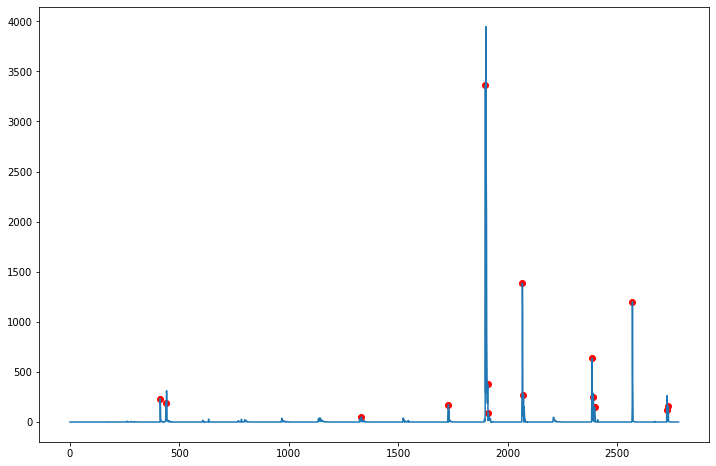

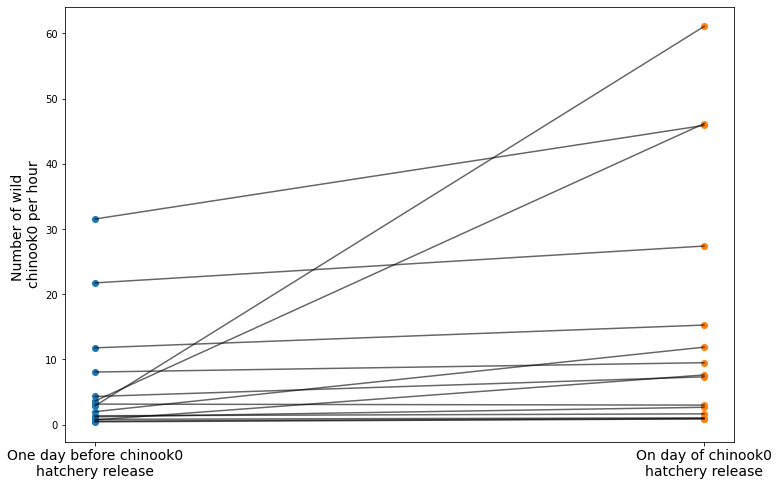

In [191]:
plot_before_after(df, "chinook","chinook", "0", "0")